In [1]:
# General utilities
import os
import json
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Image processing
import cv2
from PIL import Image

# Machine learning and deep learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras import layers, models

from tensorflow.keras.layers import GRU, Dense, Dropout

# Scikit-learn tools
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report
from sklearn.metrics import r2_score

# For progress bars
from tqdm import tqdm

In [2]:
#files
gaze_csv_path = 'gaze.csv'
gaze_json_path = 'gaze.json'
gaze_h5_path = 'gaze.h5'
real_gaze_h5_path = 'real_gaze.h5'

#folders
mpiigaze_folder = 'MPIIGaze'
normalized_folder = 'normalized'
original_folder = 'original'

In [3]:
df_csv = pd.read_csv(gaze_csv_path)
print("CSV shape:", df_csv.shape)
print(df_csv.head())

CSV shape: (50000, 10)
   Unnamed: 0                                        caruncle_2d  \
0           0  ['(215.0031, 192.4742, 8.8517)', '(215.7098, 1...   
1           1  ['(223.6765, 162.1306, 8.9962)', '(221.7880, 1...   
2           2  ['(205.6100, 177.0319, 9.2145)', '(202.6687, 1...   
3           3  ['(209.6651, 158.9221, 9.2303)', '(206.8911, 1...   
4           4  ['(208.2314, 161.6137, 9.1717)', '(204.2533, 1...   

                                         eye_details  \
0  {'look_vec': '(0.6431, -0.1524, -0.7504, 0.000...   
1  {'look_vec': '(0.2652, -0.2683, -0.9261, 0.000...   
2  {'look_vec': '(0.1989, 0.2961, -0.9342, 0.0000...   
3  {'look_vec': '(0.1647, -0.5925, -0.7885, 0.000...   
4  {'look_vec': '(-0.0701, 0.1484, -0.9864, 0.000...   

                                  eye_region_details  \
0  {'pca_shape_coeffs': ['0.0007733516', '-0.0437...   
1  {'pca_shape_coeffs': ['-0.02472504', '0.026948...   
2  {'pca_shape_coeffs': ['-0.02174765', '-0.00112...   
3  {'pc

In [4]:
#Load JSON (unsure if needed)
with open(gaze_json_path, 'r') as f:
    df_json = pd.read_json(f)
print("JSON shape:", df_json.shape)

JSON shape: (50000, 9)


Inspect the contents of an HDF5 file named gaze.h5

These files typically are in a common format for storing large structured data such as arrays, images, or sensor data.

1. We first open the file in read only mode.
2. We print to top keys in the file. 

For some reason the data's shape or what it contains doesn't get printed...

In [5]:
# Load gaze.h5
with h5py.File(gaze_h5_path, 'r') as f:
    print("Keys in gaze.h5:", list(f.keys()))
    
    #print
    for key in f.keys():
        item = f[key]
        if isinstance(item, h5py.Dataset):
            print(f"{key} is a Dataset, shape: {item.shape}")
        elif isinstance(item, h5py.Group):
            print(f"{key} is a Group containing: {list(item.keys())}")

Keys in gaze.h5: ['image', 'look_vec', 'path']
image is a Group containing: ['..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\1.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\100.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\1000.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10000.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10001.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10002.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10003.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10004.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10005.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10006.jpg', '..\\..\\

No output below...
Are there subkeys within the images?

In [6]:
with h5py.File(gaze_h5_path, 'r') as f:
    image_group = f['image']
    print("Subkeys inside 'image':", list(image_group.keys()))

Subkeys inside 'image': ['..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\1.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\100.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\1000.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10000.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10001.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10002.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10003.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10004.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10005.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10006.jpg', '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Wind

We use h5py to find how many images there are that the gaze.h5 points towards. We also use it to gather keys which are the keys to our images from the image group. (Think key/value pairs, in this case key value groups).

We used random to take a random key within our list of keys to load a sample image using matplotlib.

Found 50000 images.


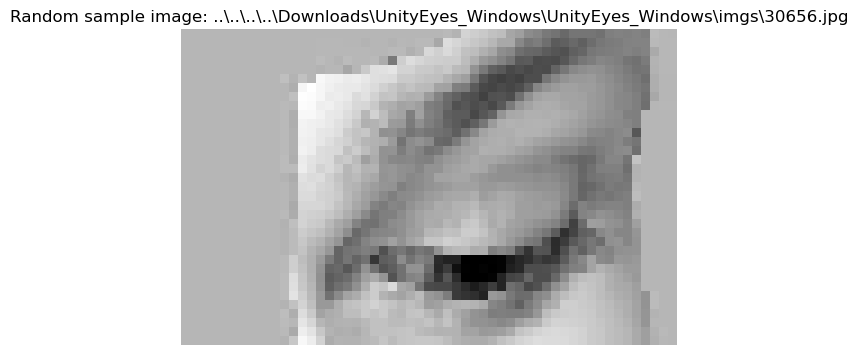

In [6]:
with h5py.File(gaze_h5_path, 'r') as f:
    image_group = f['image'] #retrieves the 'image' group, which contains multiple datasets, each representing an image
    keys = list(image_group.keys())#the keys are our images.
    print(f"Found {len(keys)} images.")

    # pick a random image key
    import random
    random_key = random.choice(keys)

    # Load the image
    sample_image = image_group[random_key][()]
    
# Visualize it
plt.imshow(sample_image, cmap='gray')
plt.title(f"Random sample image: {random_key}")
plt.axis('off')
plt.show()

In [7]:
def load_full_gaze_dataset(h5_path, limit=None):
    """
    Load all images and gaze vectors from gaze.h5 file.
    
    Args:
        h5_path (str): Path to the .h5 file
        limit (int, optional): Limit number of samples (useful for testing)
        
    Returns:
        images: np.ndarray
        gaze_vectors: np.ndarray
    """
    with h5py.File(h5_path, 'r') as f:
        image_group = f['image']
        look_vecs = f['look_vec'][:]
        
        all_keys = list(image_group.keys())
        if limit:
            all_keys = all_keys[:limit]
        
        images = []
        
        for key in tqdm(all_keys, desc="Loading images"):
            img = image_group[key][()]
            images.append(img)
        
        images = np.array(images)
        
        # If we limited, also limit gaze vectors
        if limit:
            look_vecs = look_vecs[:limit]
    
    return images, look_vecs

So to preprocess our data, we create a function that first converts the image pixel data to 32 floating point floats, then we scale between 0-1 by dividing by 255.

then we check if the images are grayscaled. We do this by checking the images. The number of images(N), the height(H), and width(W)

Then we return our normalized and reshaped image data.

In [8]:
def preprocess_data(images):
    # normalize pixel values
    images = images.astype('float32') / 255.0
    
    # Expand dimensions if grayscale
    if len(images.shape) == 3:  # (N, H, W)
        images = np.expand_dims(images, axis=-1)  # (N, H, W, 1)
    
    return images

# Load and preprocessing of data
Added a param to the load_full_gaze_dataset func to limit the amount of images we have for initial testing purposes.

In [ ]:
# Load images and look vectors
images, look_vecs = load_full_gaze_dataset(gaze_h5_path, limit=5000)  


print("Images shape before preprocessing:", images.shape)
print("Look vectors shape:", look_vecs.shape)

# Preprocess the images
images = preprocess_data(images)

print("Images shape after preprocessing:", images.shape)
print("Pixel range:", images.min(), "to", images.max())


Loading images: 100%|██████████| 5000/5000 [00:01<00:00, 3595.55it/s]


Images shape before preprocessing: (5000, 35, 55)
Look vectors shape: (5000, 4)
Images shape after preprocessing: (5000, 35, 55, 1)
Pixel range: 0.0 to 1.0


# Our train test/split. 
70 training, test 30.

Half of the test (15%) is used for the test and another half is used for validation.

70 Training/ 15 test/ 15 validation

In [103]:
# 1. First split into train and temp
X_train, X_temp, y_train, y_temp = train_test_split(images, look_vecs[:, :3], test_size=0.3, random_state=42)

# 2. Then split temp into validation and test
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Final shapes
print("Train set:", X_train.shape, y_train.shape)
print("Validation set:", X_val.shape, y_val.shape)
print("Test set:", X_test.shape, y_test.shape)


Train set: (3500, 35, 55, 1) (3500, 3)
Validation set: (750, 35, 55, 1) (750, 3)
Test set: (750, 35, 55, 1) (750, 3)


# CNN Model creation.

The layers:

Conv2D	                32 filters, (3x3), activation='relu'

MaxPooling2D	        (2x2)

Conv2D	                64 filters,(3x3), activation='relu'

MaxPooling2D	        (2x2)

Flatten	

Dense	                128 units, activation='relu'

Dense	                64 units, activation='relu'

Output Dense	        3 units, activation='linear'

- Loss: MSE
- Optimizer: Adam
- Metrics: tracking of MSE... R^2.

In [12]:
# Build the model
model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(35, 55, 1)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(3, activation='linear')  # output 3 gaze vector components
])

# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mse'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 33, 53, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 26, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 24, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 12, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 5376)              0         
                                                                 
 dense (Dense)               (None, 128)               6

# The training process...

In [105]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=32
)

Epoch 1/50
110/110 [==============================] - 2s 11ms/step - loss: 0.0410 - mse: 0.0410 - val_loss: 0.0073 - val_mse: 0.0073
Epoch 2/50
110/110 [==============================] - 1s 7ms/step - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 3/50
110/110 [==============================] - 1s 7ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 4/50
110/110 [==============================] - 1s 7ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 5/50
110/110 [==============================] - 1s 7ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 6/50
110/110 [==============================] - 1s 6ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 7/50
110/110 [==============================] - 1s 7ms/step - loss: 9.0251e-04 - mse: 9.0251e-04 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 8/50
110/110 [==============================] - 1s 7ms/step -

Here is our results, seems pretty good as the values are low. Will also add R^2 as a metric for the test results.

# Predicting on our test set.
R^2 score is pretty high here: ENTER R^2 score HERE.

In [ ]:
# Predict on test set
y_pred = model.predict(X_test)

# Calculate R^2
r2 = r2_score(y_test, y_pred)
print(f"R^2 score on test set: {r2:.4f}")

24/24 [==============================] - 0s 4ms/step
R² score on test set: 0.9902


# Plotting the gaze
Here we want to visually plot the real gaze vector with the predicted vector to see how different they are. We took the first 5 samples. 

Problem, they don't look like they are gazing at these directions...


In [18]:
def plot_gaze_vector(img, true_vec, pred_vec=None, title=""):
    h, w = img.shape[0], img.shape[1]
    center = (w // 2, h // 2)

    plt.imshow(img.squeeze(), cmap='gray')
    plt.scatter(center[0], center[1], color='blue', s=10)

    # Draw true gaze (green)

    plt.arrow(center[0], center[1],
              true_vec[0]*20, -true_vec[1]*20,
              color='green', head_width=2.5)

    # Draw predicted gaze (red)
    if pred_vec is not None:
        plt.arrow(center[0], center[1],
                  pred_vec[0]*20, -pred_vec[1]*20,
                  color='red', head_width=2.5)

    plt.title(title)
    plt.axis('off')


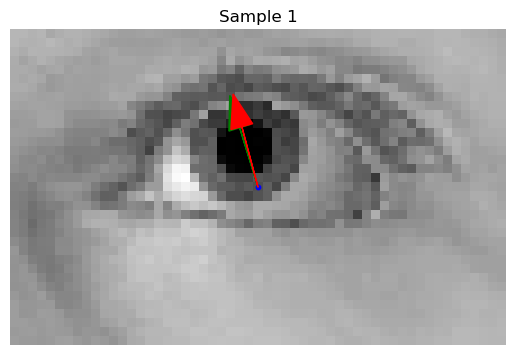

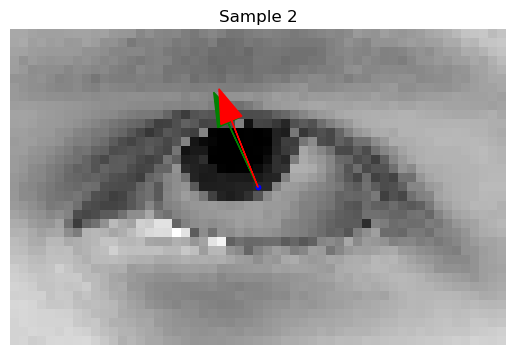

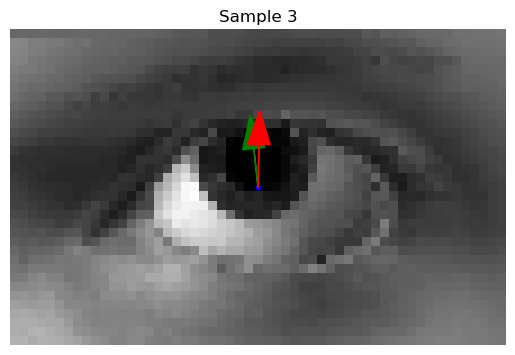

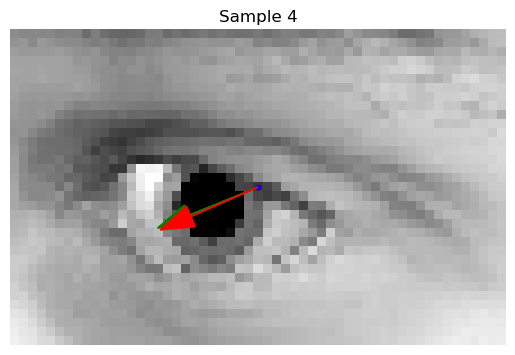

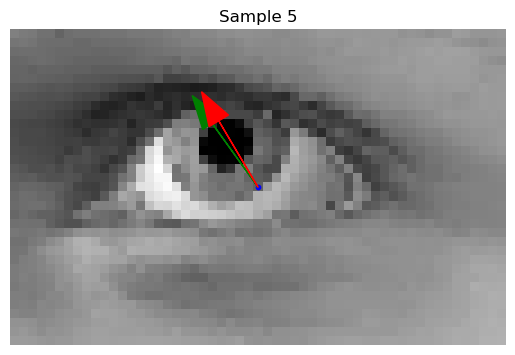

...

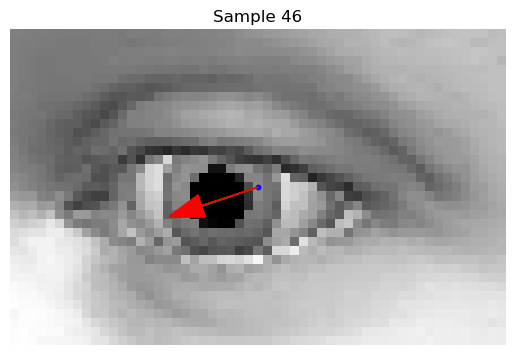

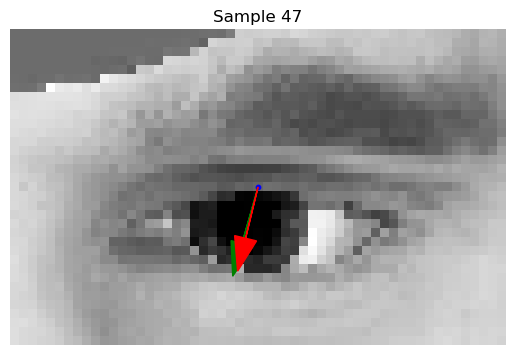

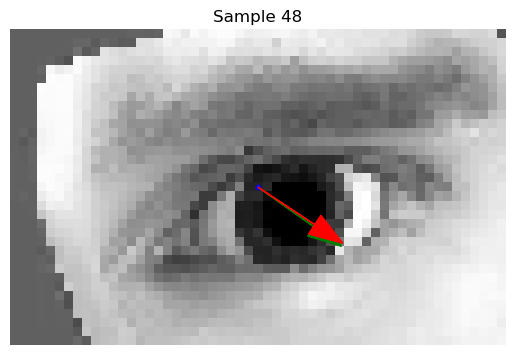

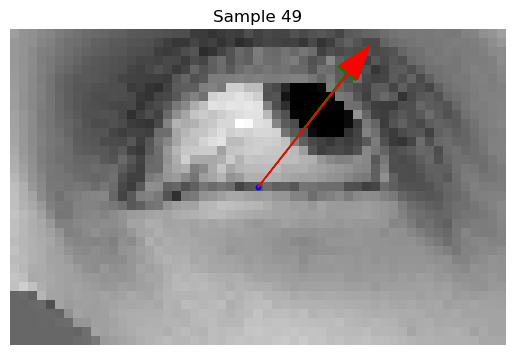

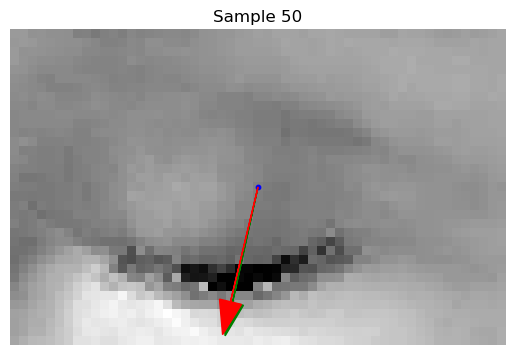

In [ ]:
# Now plot some examples
num_samples = 50
for i in range(num_samples):
    plot_gaze_vector(X_test[i], y_test[i], y_pred[i],
                     title=f"Sample {i+1}")
    plt.show()

Personal Test:
- Issue with the look vec
- What is the look vec's dimensions
- x,y,z? It's in a 3d space, need to project on 2d.
- No, it was apparently that the y axis just needed to be fliped, we don't worry to much about the z vector.

DELETE LATER

# What are our best and worst cases?

We choose the top 5 least angle errors and top 5 worst angle errors to perhaps observe, what type of images does our algorithm struggle with.

So this computes the angular error in degrees between two vectors.
First we normalized pred and true vectors to unit vectors. (We do this because we are only focusing on the direction instead of the magnitude for the angle error. **Perhaps we can also compare them by computing their magnitude difference.**)

In [15]:
def compute_angle_error(pred, true):
    """Compute angular error in degrees between two vectors."""
    pred = pred / np.linalg.norm(pred)
    true = true / np.linalg.norm(true) 
    dot = np.clip(np.dot(pred, true), -1.0, 1.0)
    angle = np.arccos(dot)  # in radians
    return np.degrees(angle)  #convert to degrees

In [ ]:
#check for the errors.
errors = []# gather all the errors here.
for i in range(len(y_test)):
    error = compute_angle_error(y_pred[i], y_test[i])
    errors.append(error)

errors = np.array(errors)

best_indices = np.argsort(errors)[:5]   # Top 5 best
worst_indices = np.argsort(errors)[-5:] # Top 5 worst

print("Best 5 errors:", errors[best_indices])
print("Worst 5 errors:", errors[worst_indices])

Best 5 errors: [0.05901518 0.09100021 0.09824411 0.09831026 0.10174396]
Worst 5 errors: [11.91622771 12.4211448  13.40081126 25.33529991 41.0594346 ]



--- Best Predictions ---


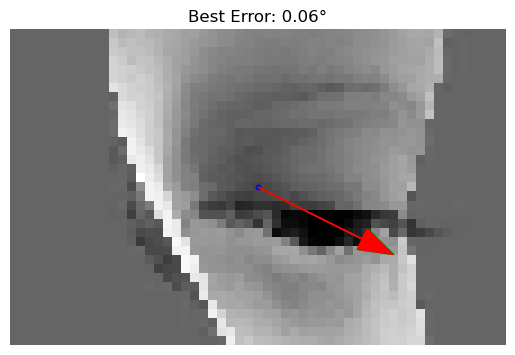

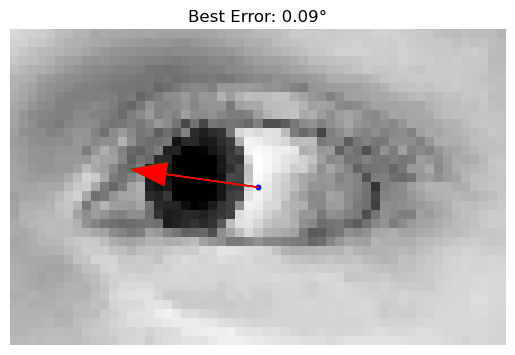

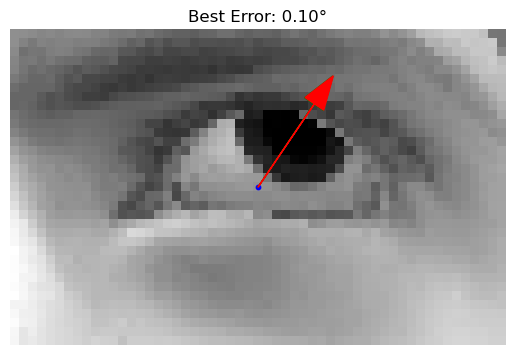

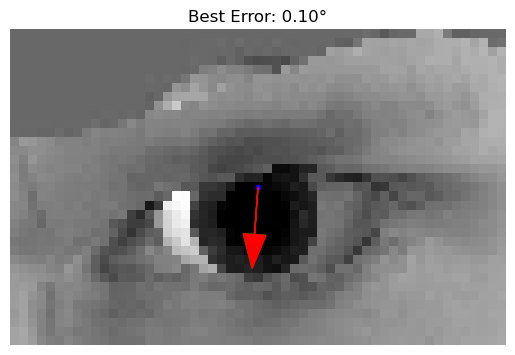

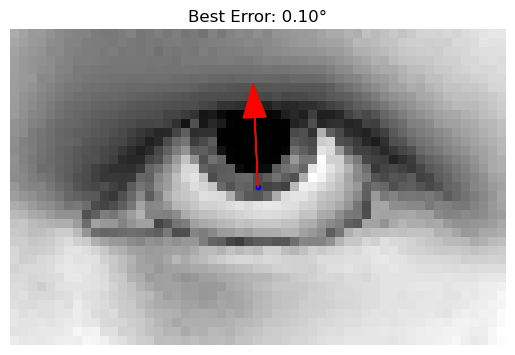


--- Worst Predictions ---


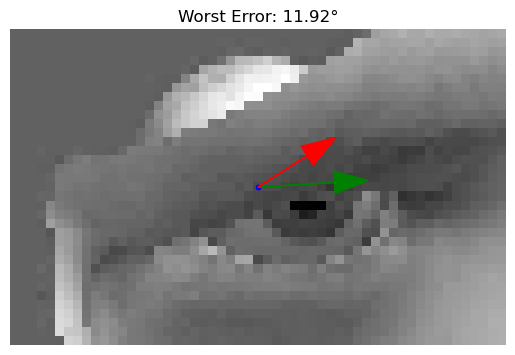

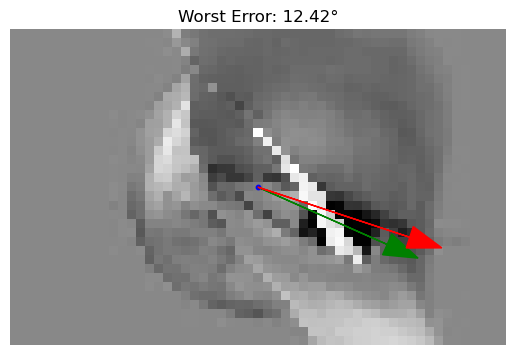

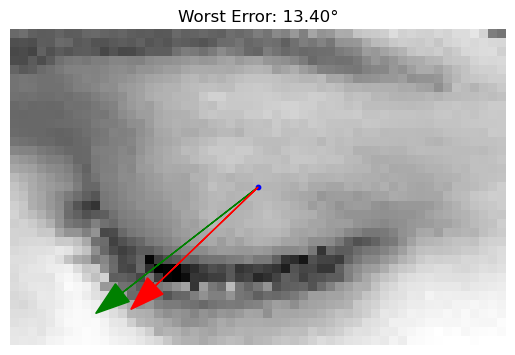

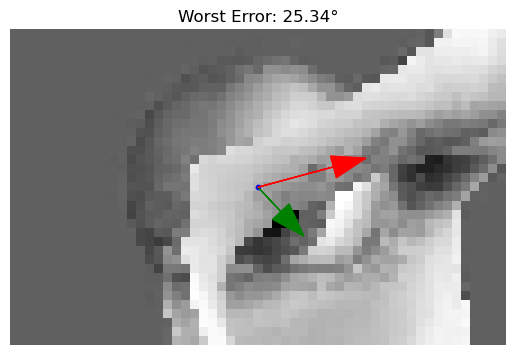

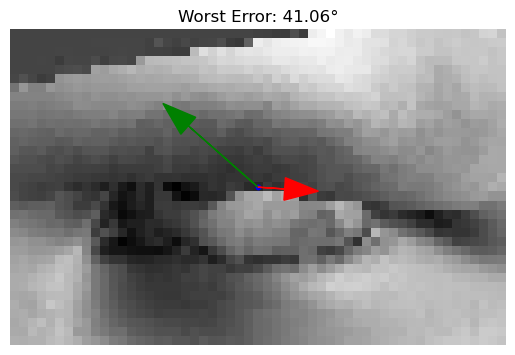

In [ ]:
# Best cases
print("\n Best Predictions")
for idx in best_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred[idx], title=f"Best Error: {errors[idx]:.2f}°")
    plt.show()

# Worst cases 
print("\n Worst Predictions ")
for idx in worst_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred[idx], title=f"Worst Error: {errors[idx]:.2f}°")
    plt.show()


# Visual Gaze transformers
ViT's expect square inputs.
Deciding between upscaling too much or too little. Our current images are 35 by 55. Better to do 64x64. There is a higher possibility to have noise and distortion then.

In [21]:
def pad_to_64x64(images):
    padded_images = []
    for img in images:
        h, w = img.shape[:2]
        pad_h = (64 - h) // 2
        pad_w = (64 - w) // 2

        # Pad (H, W, 1) correctly: ((top, bottom), (left, right), (no pad for channel))
        padded = np.pad(img, 
                        ((pad_h, 64 - h - pad_h), 
                         (pad_w, 64 - w - pad_w), 
                         (0, 0)), 
                        mode='constant', constant_values=0)
        padded_images.append(padded)

    return np.array(padded_images)


In [111]:
X_train_padded = pad_to_64x64(X_train)
X_val_padded = pad_to_64x64(X_val)
X_test_padded = pad_to_64x64(X_test)

Making sure it is normalized... I remember doing it already but just in case.

In [112]:
print(X_train.max(), X_train.min())

1.0 0.0


The VIT

Our parameters
- input shape: our images are 64x64, and are grayscale(so channel 1)
- patch size: our images are divided into 8x8 patches.
- num patches: the total number of patches is (64/8)^2
- projection dimension: each patch will be projected to a 64-dimensional vector (this is the embedding dimension).
- num heads: 4 heads for multi head self attention. 
- transformer units: size of hidden layers in each transformer block
- transformer layers: total transformer layers in the encoder stack.
- mlp head units: hidden units in the final MLP head(for prediction)

Key definitions:
- Multi head self attention: Self-attention allows the model to weigh the importance of different patches in the image relative to each other. For example, a patch near the eye might pay attention to surrounding areas like eyebrows or eye corners.
    - For a given set of input vectors (which are also patch embeddings), self attention projects them into queries(Q), keys(L) and values (V). 
    - Then they compute attention scores: This formula Attention(Q,K,V)=softmax((QK^T)/sqrt(d_k))*V
    - And now multi head self attention? Instead of doing the above once, it does it multiple times in parrelel. In our case we do it 4 times, using different linear projections for Q,K,and V.
    - This allows the model to learn different types of relationships or attentional patterns simultaneously. These include edges, shapes or globabl layout.


Step 1: Divide the 64×64 grayscale image into 64 flat patches (8x8 each).

Step 2: Project each patch to a 64-dimensional embedding.

Step 3: Add learnable positional embeddings.

Patching
- Encoding layer:
    - The purpose is to project each flattened patch into a higher dimensional space and adds positional information.
    - The output is a sequence of 64 embedded vectors, each of size 64: Shape = (batch_size, 64 patches, 64 embedding dims)
- Creation layer:
    - The purpose is to split each image into non-overlapping patches of size 8x8 (patchsize*patchsize)
    - tf.image.extract_patches to: slide a window over the image, extract 8x8 blocks (patches), flatten them into vectors.
    - Output shape: (batch_size, num_patches, patch_dims)
    - For grayscale: patch_dims = 8x8x1 = 64.


In [22]:
# Parameters
input_shape = (64, 64, 1)
patch_size = 8
num_patches = (64 // patch_size) ** 2
projection_dim = 64
num_heads = 4 #using 4 attention heads in each self-attention layer
transformer_units = [128, 64]
transformer_layers = 4
mlp_head_units = [128, 64]

# Patch encoding layer
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.projection = layers.Dense(projection_dim) #Learnable positional encoding, gives the model awareness of patch order.
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)

    def call(self, patch):
        positions = tf.range(start=0, limit=num_patches, delta=1)# creates a vector of integers [0, 1, ..., 63] (one for each patch)
        encoded = self.projection(patch) + self.position_embedding(positions)
        return encoded

# Patch creation layer
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding='VALID',
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

Creating the model.
Steps:
- We first define the input. We tell that it should expect to recieve square grayscale images of the size defined in the input shape( 64,64,1 as we defined before)
- Next we split the image into patches. We break the image into small non-overlapping patches. Since our patch size is 8, each image because 8x8(64) patches. The patch is also falttened into a vector. Transformers like ViT work on sequences. So we turn the image into a sequence of patches, similar to splitting a sentence into words.
- Next step is encoding the patches. We take the flattened patches and project each patch into a 64-dimensional space. This is a vector of length 64. This also adds positional embeddings so the model knows the order of the patches.
- Next we create the transformer encoder blocks. These blocks are the heart of our transformer. This is where the model is able to learn to focus on important parts of the image. The process for the creation of the transformer/encoder blocks:
    - We start off first by normalizing the layer. This normalizes the data across features. Also helps with stabilized training. (x1)
    - Then we use Multi-head self attention. Each patch attends to every other heads. Remember the explanation from earlier. It helps understand relationships between patches.
    - Then we skip connection (x2). Add original input(encoded_patches) back to the output of attention. Prevents the information loss and helps gradient flow.
    - Then we go to second layer of normalization. (x3)
    - Then we apply the feedforward MLP. A mini neural net is applied to each patch. It learns more complex representations.
    - Then we have a second skip connection. Here it adds the result of the mlp to the previous attention output. 
- A key reminder that the above was repeated 4 times because we have 4 transformation layers.
- And finaly we have the final representation.
    - We normalize again. Then we flatten(to remind what flatten does): we convert all patch outputs into a single long vector (1 dimensional), into a row
- The MLP head are the final layers. They are fully connected layers to refine the featrues for the final prediction.
- Then our output layer. THe final output layer will outut 3 numbers. The 3D gaze direction vector.

After creating the model, vit_regressor(), We build the model.

In [23]:
def create_vit_regressor():
    inputs = layers.Input(shape=input_shape)
    patches = Patches(patch_size)(inputs)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    #transformer blocks
    for _ in range(transformer_layers):
        #layer normalization 1
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        # multi-head attention
        attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.1)(x1, x1)
        # skip connection 1
        x2 = layers.Add()([attention, encoded_patches])
        # layer normalization 2
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        # mLP
        x3 = layers.Dense(transformer_units[0], activation='relu')(x3)
        x3 = layers.Dense(transformer_units[1], activation='relu')(x3)
        # skip connection 2
        encoded_patches = layers.Add()([x3, x2])

    # flatten & MLP head for regression
    representation = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    representation = layers.Flatten()(representation)
    for units in mlp_head_units:
        representation = layers.Dense(units, activation='relu')(representation)
    outputs = layers.Dense(3)(representation)  # 3D look vector output

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

Train the model now.

In [ ]:
vit_model = create_vit_regressor()
vit_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Train
history = vit_model.fit(
    X_train_padded, y_train,
    validation_data=(X_val_padded, y_val),
    epochs=50,
    batch_size=32
)

Epoch 1/50
110/110 [==============================] - 10s 44ms/step - loss: 0.2804 - mae: 0.3247 - val_loss: 0.0872 - val_mae: 0.2248
Epoch 2/50
110/110 [==============================] - 4s 36ms/step - loss: 0.0752 - mae: 0.2111 - val_loss: 0.0455 - val_mae: 0.1587
Epoch 3/50
110/110 [==============================] - 4s 37ms/step - loss: 0.0478 - mae: 0.1627 - val_loss: 0.0305 - val_mae: 0.1238
Epoch 4/50
110/110 [==============================] - 4s 36ms/step - loss: 0.0267 - mae: 0.1207 - val_loss: 0.0279 - val_mae: 0.1218
Epoch 5/50
110/110 [==============================] - 4s 36ms/step - loss: 0.0292 - mae: 0.1227 - val_loss: 0.0475 - val_mae: 0.1820
Epoch 6/50
110/110 [==============================] - 4s 37ms/step - loss: 0.0163 - mae: 0.0938 - val_loss: 0.0147 - val_mae: 0.0853
Epoch 7/50
110/110 [==============================] - 4s 36ms/step - loss: 0.0108 - mae: 0.0758 - val_loss: 0.0116 - val_mae: 0.0770
Epoch 8/50
110/110 [==============================] - 4s 36ms/step -

Now that we trained our ViT: next step is predicting on our test set.

In [116]:
y_pred_vit = vit_model.predict(X_test_padded)

24/24 [==============================] - 1s 21ms/step


tryin out a different way to get the angle error.

In [ ]:
errors = np.linalg.norm(y_pred_vit - y_test, axis=1)
best_indices = np.argsort(errors)[:10]   #10 best
worst_indices = np.argsort(errors)[-10:] # 10 worst

Best Predictions:


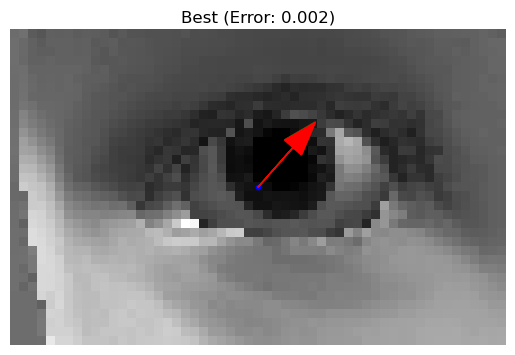

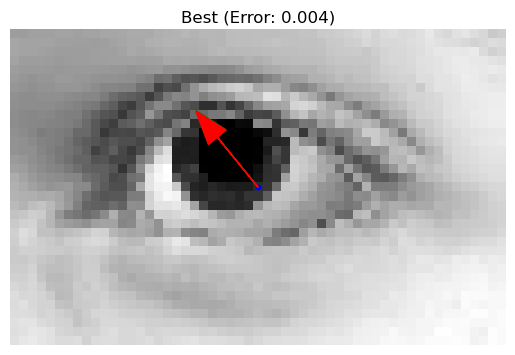

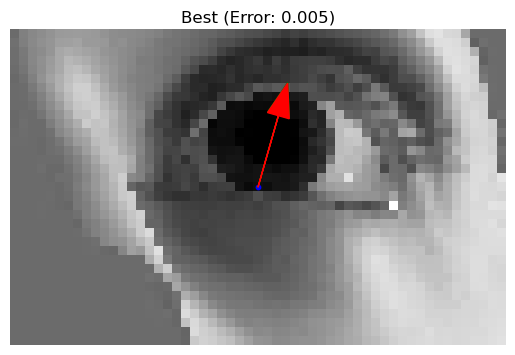

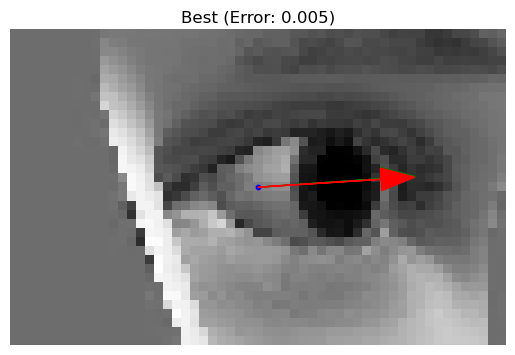

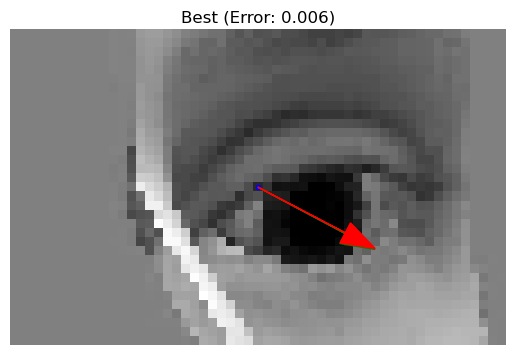

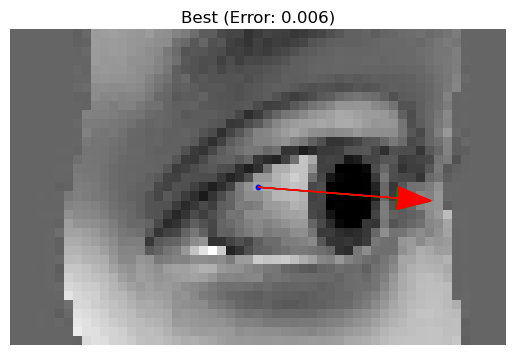

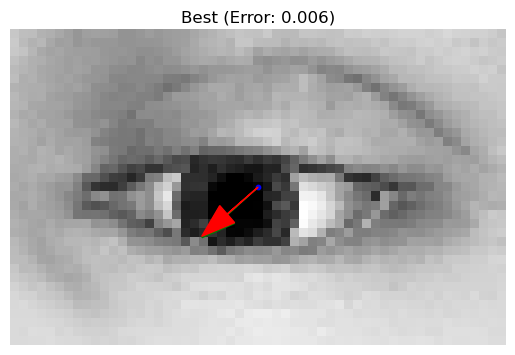

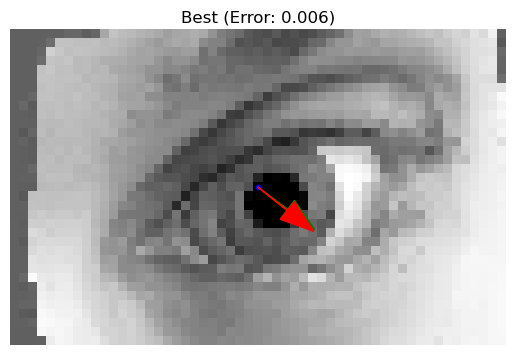

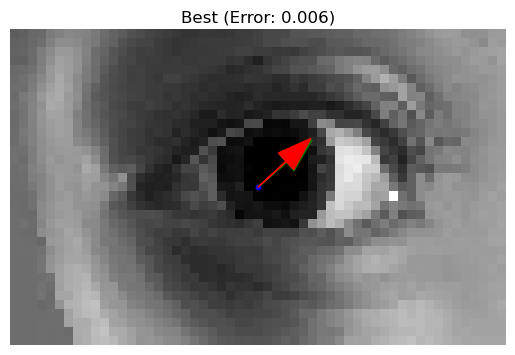

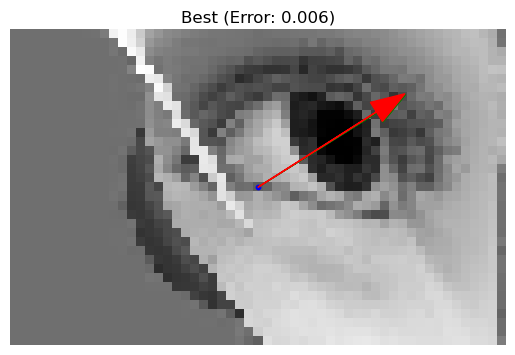

In [118]:
print("Best Predictions:")
for idx in best_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_vit[idx],
                     title=f"Best (Error: {errors[idx]:.3f})")
    plt.show()

Worst Predictions:


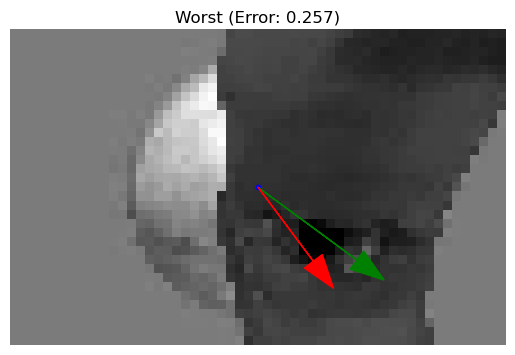

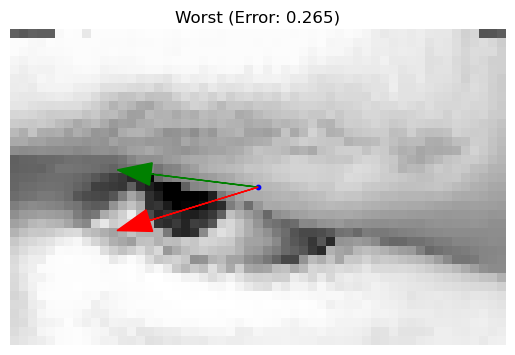

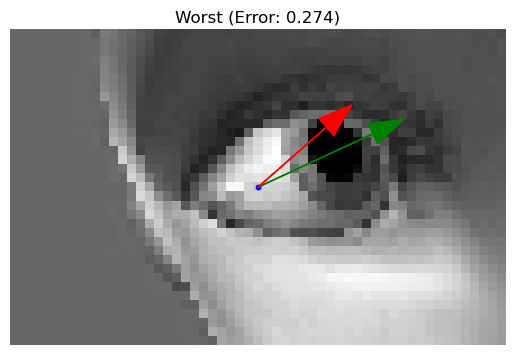

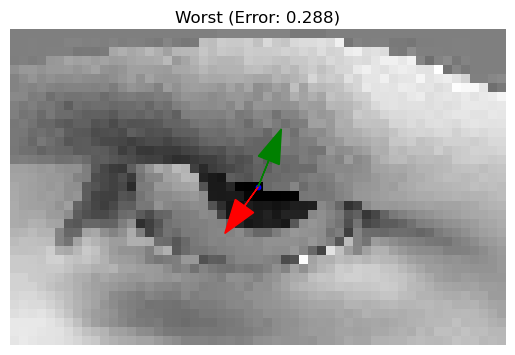

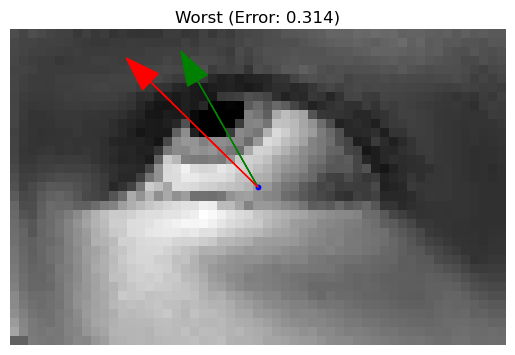

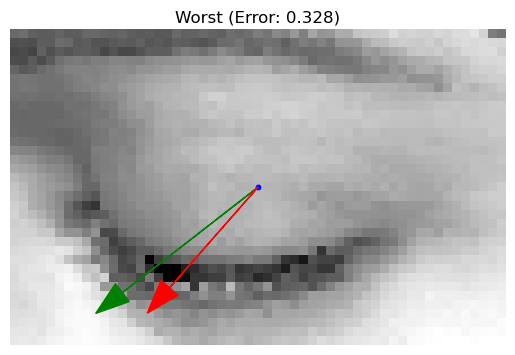

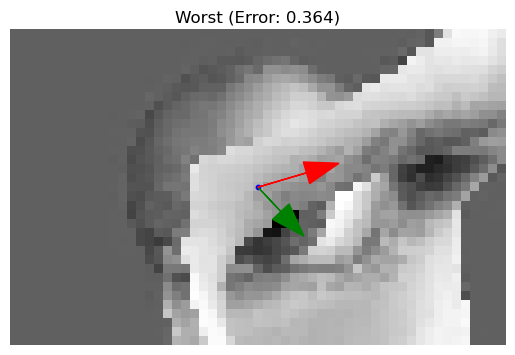

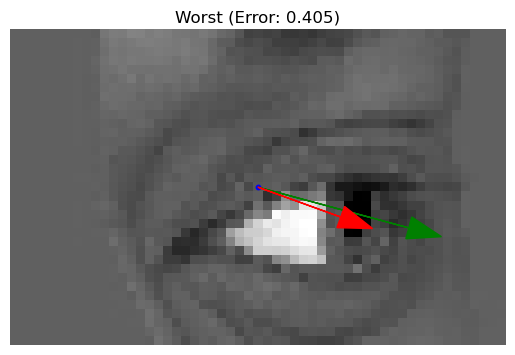

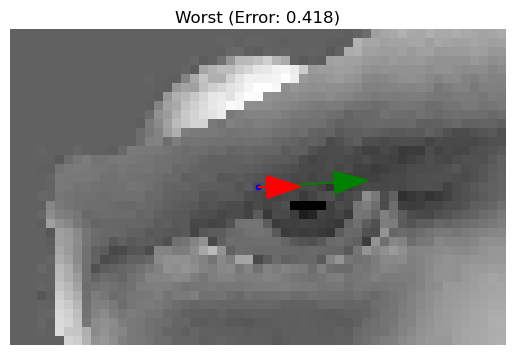

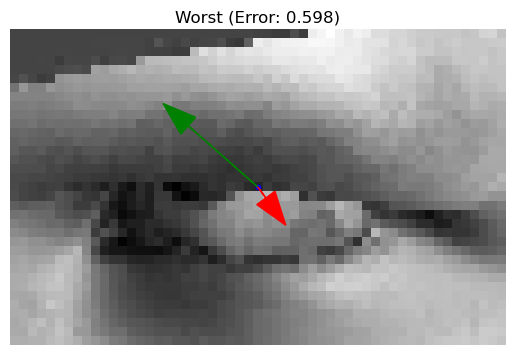

In [119]:
print("Worst Predictions:")
for idx in worst_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_vit[idx],
                     title=f"Worst (Error: {errors[idx]:.3f})")
    plt.show()

# Comparing CNN & ViT
We see that CNN did better than ViT

In [ ]:
# CNN Metrics
mse_cnn = mean_squared_error(y_test, y_pred)
r2_cnn = r2_score(y_test, y_pred)

# ViT Metrics
mse_vit = mean_squared_error(y_test, y_pred_vit)
r2_vit = r2_score(y_test, y_pred_vit)

# Print
print(f"CNN MSE: {mse_cnn:.4f}, R^2: {r2_cnn:.4f}")
print(f"ViT MSE: {mse_vit:.4f}, R^2: {r2_vit:.4f}")

CNN MSE: 0.0007, R²: 0.9902
ViT MSE: 0.0019, R²: 0.9744


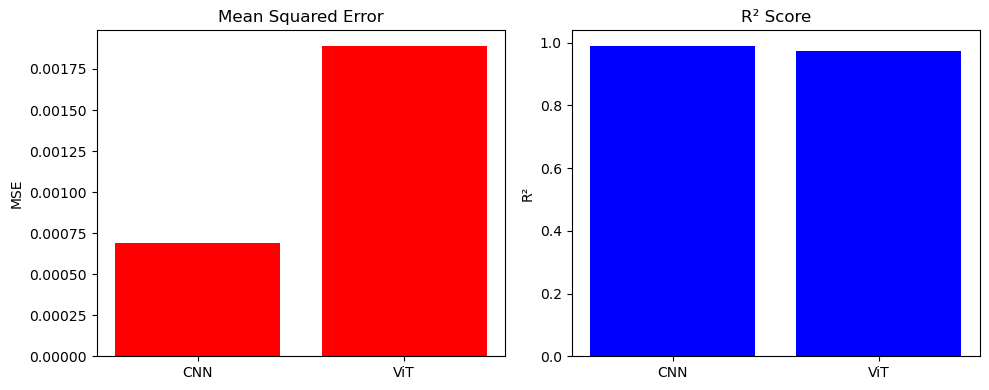

In [ ]:
models = ['CNN', 'ViT']
mses = [mse_cnn, mse_vit]
r2s = [r2_cnn, r2_vit]

plt.figure(figsize=(10, 4))

# MSE
plt.subplot(1, 2, 1)
plt.bar(models, mses, color='red')
plt.title("Mean Squared Error")
plt.ylabel("MSE")

# R^2
plt.subplot(1, 2, 2)
plt.bar(models, r2s, color='blue')
plt.title("R^2 Score")
plt.ylabel("R^2")

plt.tight_layout()
plt.show()

# RNN
What is an RNN?

RNN's are usually used for sequential data. To do this experiment we came up with the ingenious idea of using the image rows/columns as sequencies. So 35,55: we will have 35 features with 55 steps.

1st step is reshaping the data

In [ ]:
H, W = X_train_padded.shape[1], X_train_padded.shape[2]
# Reshape for RNN: (samples, time_steps, features)
X_train_rnn = X_train_padded.reshape(-1, W, H)
X_val_rnn = X_val_padded.reshape(-1, W, H)
X_test_rnn = X_test_padded.reshape(-1, W, H)

Building the RNN

The parameters
- 

In [30]:
rnn_model = Sequential([
    GRU(64, return_sequences=True, input_shape=(W, H)),
    Dropout(0.3),
    GRU(32),
    Dropout(0.3),
    Dense(16, activation='relu'),
    Dense(3)  # Output is 3D gaze vector
])

rnn_model.compile(optimizer='adam', loss='mse', metrics=['mae'])
rnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 64, 64)            24960     
                                                                 
 dropout (Dropout)           (None, 64, 64)            0         
                                                                 
 gru_1 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_15 (Dense)            (None, 16)                528       
                                                                 
 dense_16 (Dense)            (None, 3)                 51        
                                                                 
Total params: 34,947
Trainable params: 34,947
Non-trai

Training

In [126]:
history_rnn = rnn_model.fit(
    X_train_rnn, y_train,
    validation_data=(X_val_rnn, y_val),
    epochs=50,
    batch_size=64
)

Epoch 1/50
55/55 [==============================] - 3s 48ms/step - loss: 0.2247 - mae: 0.3975 - val_loss: 0.1163 - val_mae: 0.2715
Epoch 2/50
55/55 [==============================] - 2s 30ms/step - loss: 0.1219 - mae: 0.2786 - val_loss: 0.1086 - val_mae: 0.2619
Epoch 3/50
55/55 [==============================] - 2s 28ms/step - loss: 0.1132 - mae: 0.2674 - val_loss: 0.1064 - val_mae: 0.2569
Epoch 4/50
55/55 [==============================] - 2s 30ms/step - loss: 0.1027 - mae: 0.2549 - val_loss: 0.0809 - val_mae: 0.2247
Epoch 5/50
55/55 [==============================] - 2s 31ms/step - loss: 0.0790 - mae: 0.2205 - val_loss: 0.0676 - val_mae: 0.2032
Epoch 6/50
55/55 [==============================] - 2s 30ms/step - loss: 0.0695 - mae: 0.2063 - val_loss: 0.0619 - val_mae: 0.1908
Epoch 7/50
55/55 [==============================] - 2s 30ms/step - loss: 0.0653 - mae: 0.1984 - val_loss: 0.0601 - val_mae: 0.1907
Epoch 8/50
55/55 [==============================] - 2s 30ms/step - loss: 0.0615 - m

Predicting

In [ ]:
y_pred_rnn = rnn_model.predict(X_test_rnn)


mse_rnn = mean_squared_error(y_test, y_pred_rnn)
r2_rnn = r2_score(y_test, y_pred_rnn)

print(f"RNN MSE: {mse_rnn:.4f}, R^2: {r2_rnn:.4f}")

24/24 [==============================] - 1s 14ms/step
RNN MSE: 0.0048, R^2: 0.9322


Best Predictions:


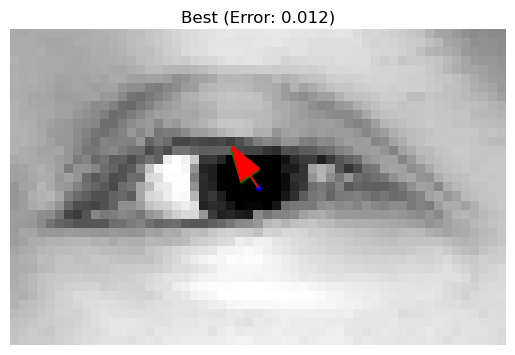

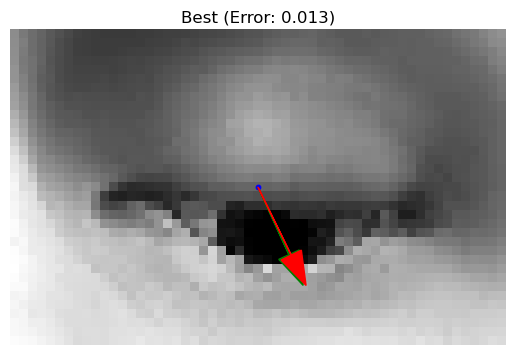

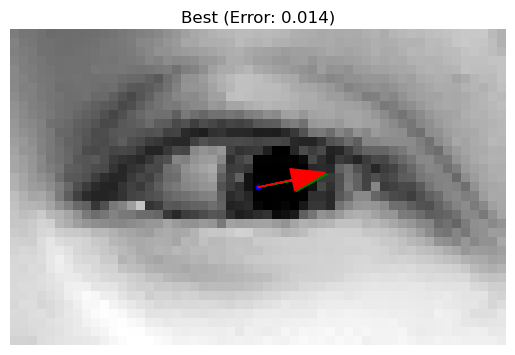

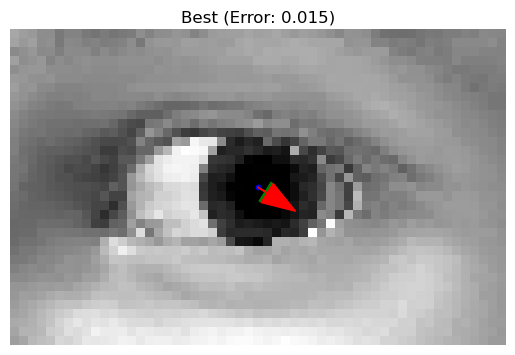

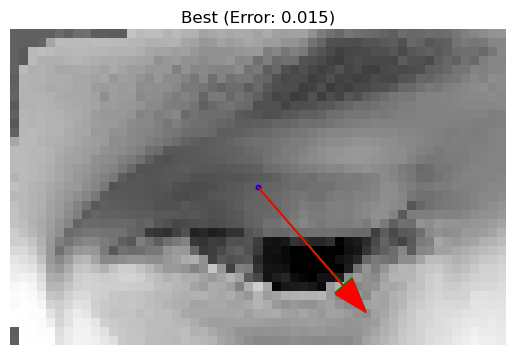

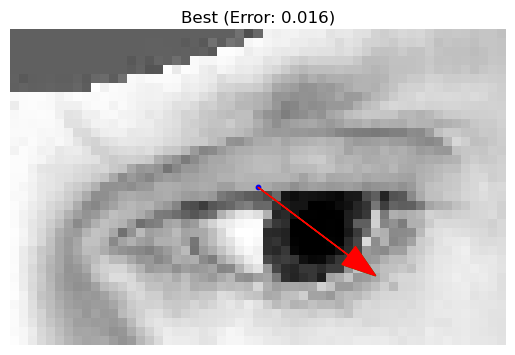

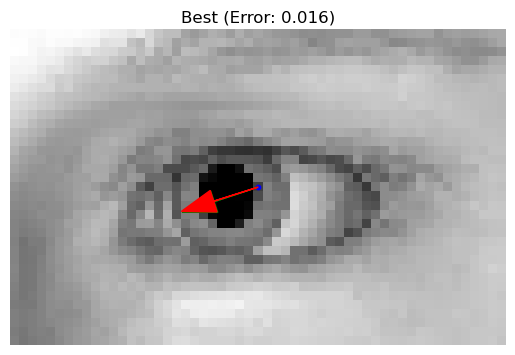

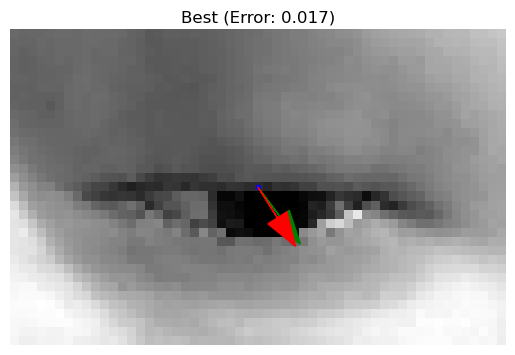

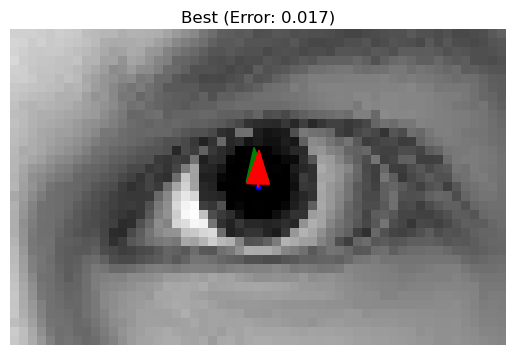

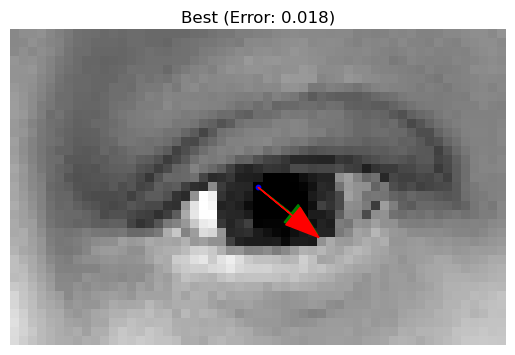

Worst Predictions:


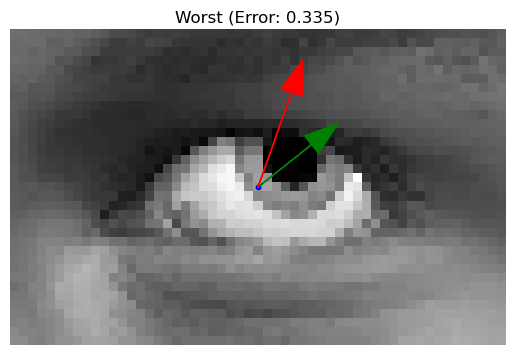

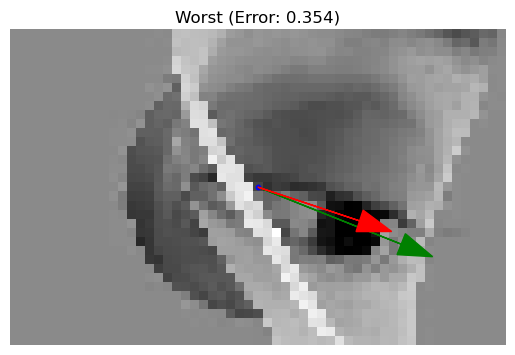

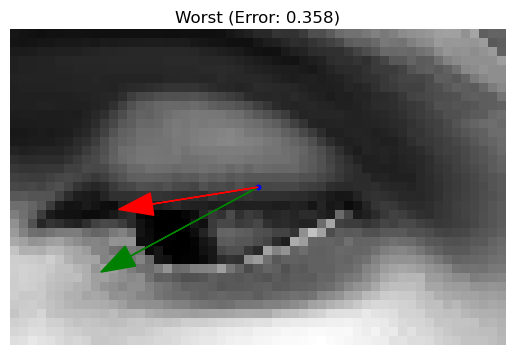

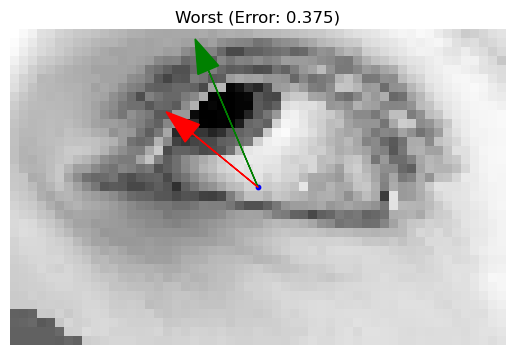

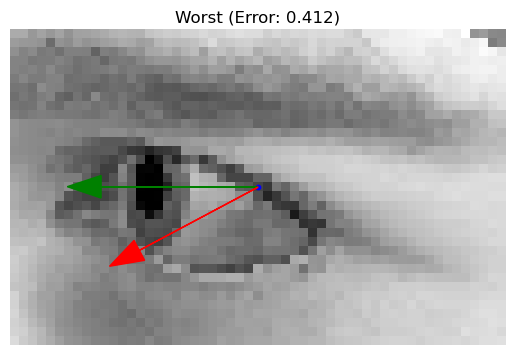

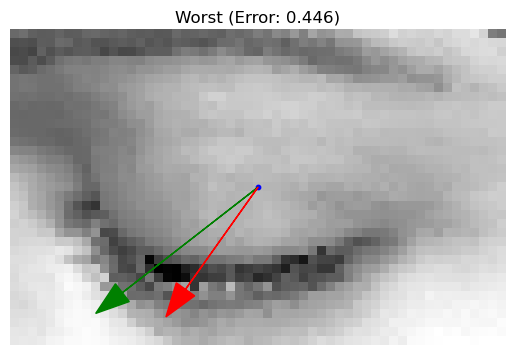

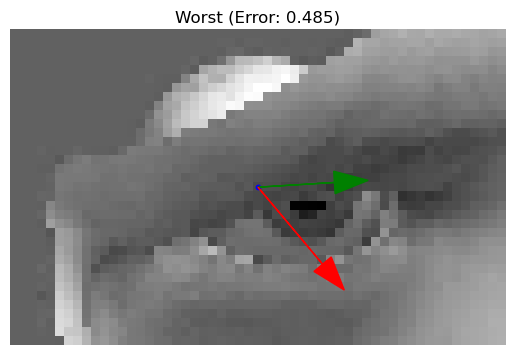

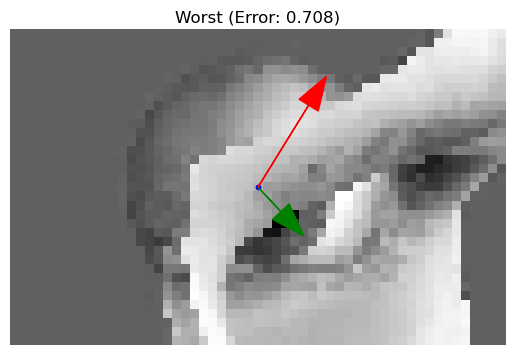

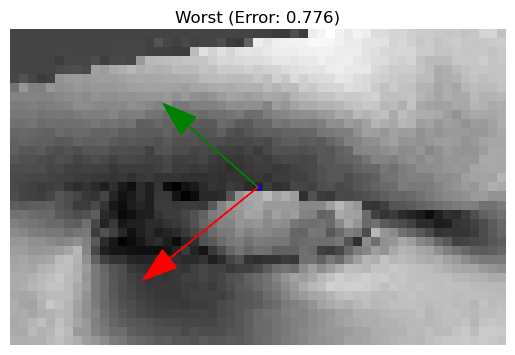

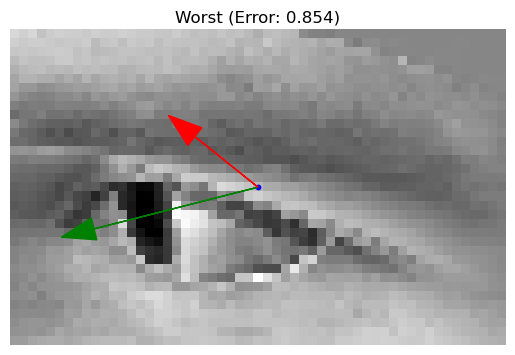

In [133]:
errors = np.linalg.norm(y_pred_rnn - y_test, axis=1)
best_indices = np.argsort(errors)[:10]   # 10 best
worst_indices = np.argsort(errors)[-10:] # 10 worst
print("Best Predictions:")
for idx in best_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_rnn[idx],
                     title=f"Best (Error: {errors[idx]:.3f})")
    plt.show()
print("Worst Predictions:")
for idx in worst_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_rnn[idx],
                     title=f"Worst (Error: {errors[idx]:.3f})")
    plt.show()

Comparing our models.

In [128]:
print(f"CNN MSE: {mse_cnn:.4f}, R^2: {r2_cnn:.4f}")
print(f"ViT MSE: {mse_vit:.4f}, R^2: {r2_vit:.4f}")
print(f"RNN MSE: {mse_rnn:.4f}, R^2: {r2_rnn:.4f}")

CNN MSE: 0.0007, R^2: 0.9902
ViT MSE: 0.0019, R^2: 0.9744
RNN MSE: 0.0048, R^2: 0.9322


Note: maybe zoom in on the R^2 bar graph to make it easier to show their difference.

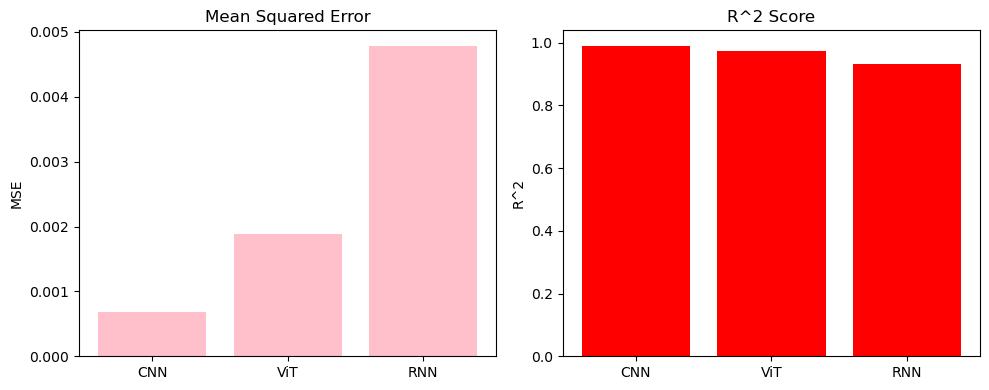

In [ ]:
models = ['CNN', 'ViT','RNN']
mses = [mse_cnn, mse_vit,mse_rnn]
r2s = [r2_cnn, r2_vit,r2_rnn]

plt.figure(figsize=(10, 4))

# MSE
plt.subplot(1, 2, 1)
plt.bar(models, mses, color='pink')
plt.title("Mean Squared Error")
plt.ylabel("MSE")

# R^2
plt.subplot(1, 2, 2)
plt.bar(models, r2s, color='red')
plt.title("R^2 Score")
plt.ylabel("R^2")

plt.tight_layout()
plt.show()

# Real eye gazes.

Let's now test it on the real gaze data set. We've been testing so far on synthetic gazes made in unity. 

Oop, we don't have the gaze vector data for real eye gazes.

In [65]:
# Load gaze.h5
with h5py.File(real_gaze_h5_path, 'r') as f:
    print("Keys in real_gaze.h5:", list(f.keys()))
    
    # Let's print
    for key in f.keys():
        item = f[key]
        if isinstance(item, h5py.Dataset):
            print(f"{key} is a Dataset, shape: {item.shape}")
        elif isinstance(item, h5py.Group):
            print(f"{key} is a Group containing: {list(item.keys())}")

Keys in real_gaze.h5: ['image']
image is a Group containing: ['..\\data\\MPIIGaze_Dataset\\000055ed-890a-411f-be6e-b8453b495389.png', '..\\data\\MPIIGaze_Dataset\\00008247-feb6-46a0-afa8-7daad5100e66.png', '..\\data\\MPIIGaze_Dataset\\00008822-d1dd-4764-8e1c-a03ccc161fe3.png', '..\\data\\MPIIGaze_Dataset\\000099d1-204b-4783-b09d-05a26015f702.png', '..\\data\\MPIIGaze_Dataset\\0000aa15-4458-4849-8e9f-70429098337c.png', '..\\data\\MPIIGaze_Dataset\\0000d5db-0fde-418d-9ca7-f8db885576d6.png', '..\\data\\MPIIGaze_Dataset\\00012c2d-0324-4f6c-926c-49cfa4421ce5.png', '..\\data\\MPIIGaze_Dataset\\00014cb5-8c82-4320-b297-624681a66ff0.png', '..\\data\\MPIIGaze_Dataset\\0001ba80-a9bc-4b8d-9789-20b74a91917f.png', '..\\data\\MPIIGaze_Dataset\\0001e619-ec59-442a-b5b3-7acde20160f2.png', '..\\data\\MPIIGaze_Dataset\\0001f7b5-146a-486f-a29b-18d46bac67b1.png', '..\\data\\MPIIGaze_Dataset\\00023baa-c740-4a75-a40b-70728d62c0c1.png', '..\\data\\MPIIGaze_Dataset\\000253d7-c6fe-45f6-a1d3-ccb18b6b6669.png', '.

TODO:
Use all 50,000 images. Use a 66/34 training/testing split.

Training: 66%
Testing: 17%
Validating 17%

Use the entirety of our dataset this time.

In [9]:
images, look_vecs = load_full_gaze_dataset(gaze_h5_path)  
images = preprocess_data(images)

Loading images: 100%|██████████| 50000/50000 [00:13<00:00, 3595.97it/s]


In [10]:
X_train, X_temp, y_train, y_temp = train_test_split(images, look_vecs[:, :3], test_size=0.34)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5)

Train the CNN. We'll use the same model we crafted before.

In [13]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=32
)

Epoch 1/50
1032/1032 [==============================] - 20s 8ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 7.1687e-04 - val_mse: 7.1687e-04
Epoch 2/50
1032/1032 [==============================] - 8s 7ms/step - loss: 5.9505e-04 - mse: 5.9505e-04 - val_loss: 5.0072e-04 - val_mse: 5.0072e-04
Epoch 3/50
1032/1032 [==============================] - 8s 8ms/step - loss: 4.4231e-04 - mse: 4.4231e-04 - val_loss: 4.2259e-04 - val_mse: 4.2259e-04
Epoch 4/50
1032/1032 [==============================] - 7s 7ms/step - loss: 3.8653e-04 - mse: 3.8653e-04 - val_loss: 4.4070e-04 - val_mse: 4.4070e-04
Epoch 5/50
1032/1032 [==============================] - 7s 7ms/step - loss: 3.2680e-04 - mse: 3.2680e-04 - val_loss: 3.9573e-04 - val_mse: 3.9573e-04
Epoch 6/50
1032/1032 [==============================] - 8s 7ms/step - loss: 2.7814e-04 - mse: 2.7814e-04 - val_loss: 3.6221e-04 - val_mse: 3.6221e-04
Epoch 7/50
1032/1032 [==============================] - 8s 7ms/step - loss: 2.7053e-04 - mse: 2.7053e-04 - 

In [14]:
y_pred = model.predict(X_test)

r2 = r2_score(y_test, y_pred)
print(f"R^2 CNN: {r2:.4f}")

266/266 [==============================] - 1s 3ms/step
R^2 CNN: 0.9980


In [16]:
errors = []# gather all the errors here.
for i in range(len(y_test)):
    error = compute_angle_error(y_pred[i], y_test[i])
    errors.append(error)

errors = np.array(errors)

best_indices = np.argsort(errors)[:5]   # Top 5 best
worst_indices = np.argsort(errors)[-5:] # Top 5 worst

print("Best 5 errors:", errors[best_indices])
print("Worst 5 errors:", errors[worst_indices])

Best 5 errors: [0.         0.00351414 0.00534144 0.01158251 0.01636623]
Worst 5 errors: [ 8.77415607  9.85527177 15.14922767 16.22099673 18.54289976]



 Best Predictions


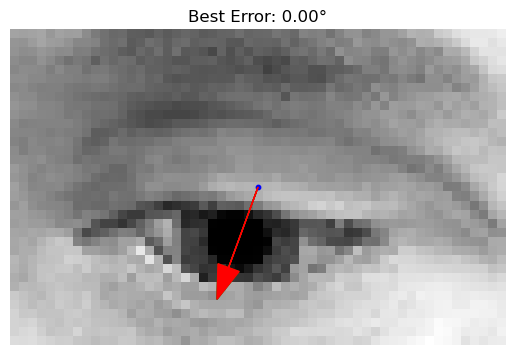

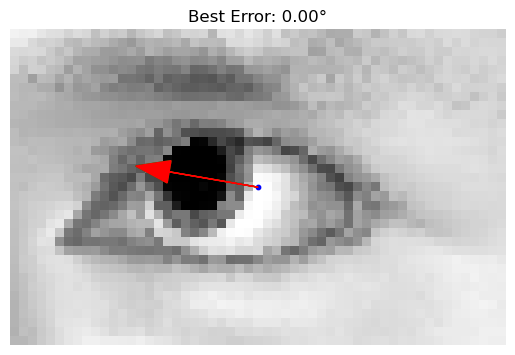

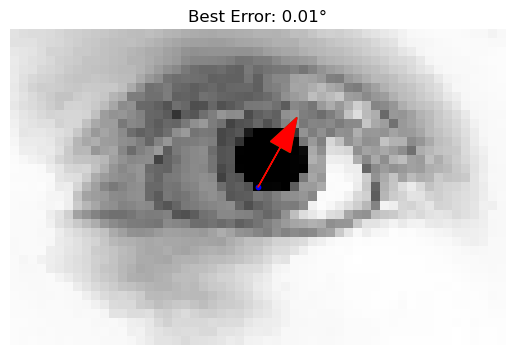

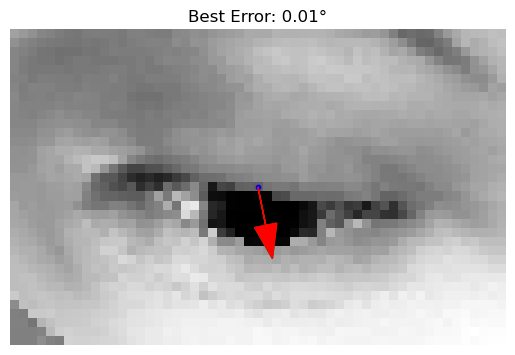

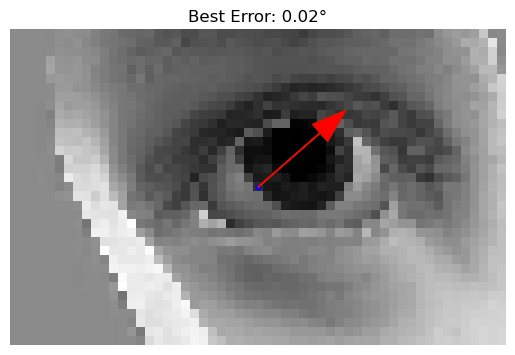


 Worst Predictions 


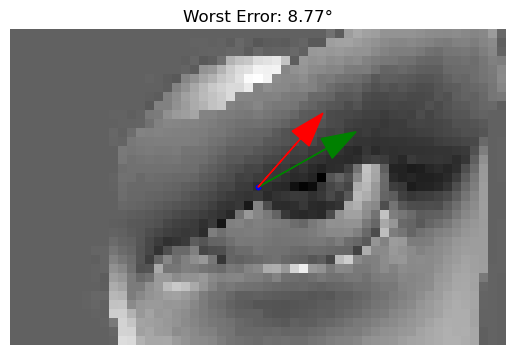

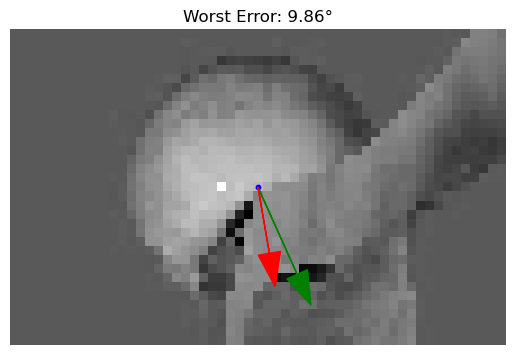

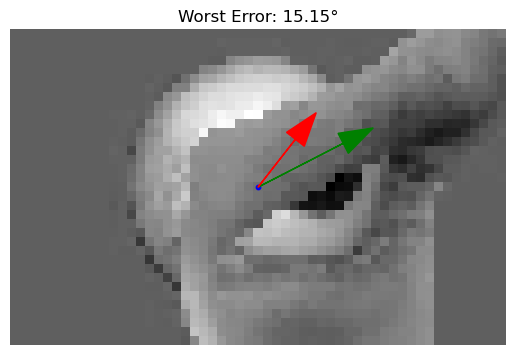

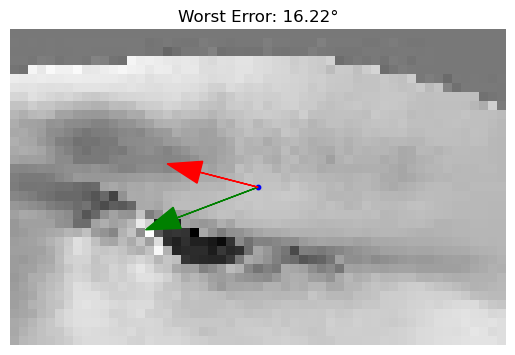

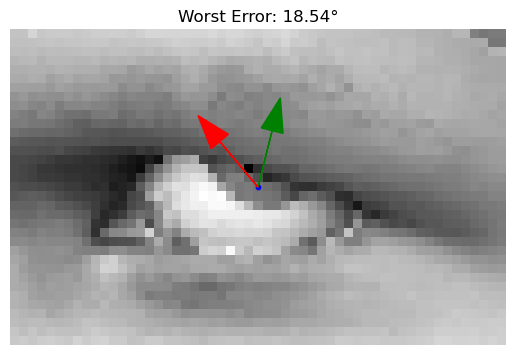

In [19]:
# Best cases
print("\n Best Predictions")
for idx in best_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred[idx], title=f"Best Error: {errors[idx]:.2f}°")
    plt.show()

# Worst cases 
print("\n Worst Predictions ")
for idx in worst_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred[idx], title=f"Worst Error: {errors[idx]:.2f}°")
    plt.show()

Setup for ViT

In [24]:
X_train_padded = pad_to_64x64(X_train)
X_val_padded = pad_to_64x64(X_val)
X_test_padded = pad_to_64x64(X_test)

In [25]:
vit_model = create_vit_regressor()
vit_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

history_vit = vit_model.fit(
    X_train_padded, y_train,
    validation_data=(X_val_padded, y_val),
    epochs=50,
    batch_size=32
)

Epoch 1/50
1032/1032 [==============================] - 52s 46ms/step - loss: 0.0481 - mae: 0.1261 - val_loss: 0.0068 - val_mae: 0.0569
Epoch 2/50
1032/1032 [==============================] - 45s 44ms/step - loss: 0.0053 - mae: 0.0522 - val_loss: 0.0042 - val_mae: 0.0471
Epoch 3/50
1032/1032 [==============================] - 53s 52ms/step - loss: 0.0033 - mae: 0.0419 - val_loss: 0.0026 - val_mae: 0.0355
Epoch 4/50
1032/1032 [==============================] - 67s 65ms/step - loss: 0.0028 - mae: 0.0385 - val_loss: 0.0030 - val_mae: 0.0404
Epoch 5/50
1032/1032 [==============================] - 55s 53ms/step - loss: 0.0024 - mae: 0.0352 - val_loss: 0.0041 - val_mae: 0.0454
Epoch 6/50
1032/1032 [==============================] - 46s 45ms/step - loss: 0.0262 - mae: 0.0935 - val_loss: 0.0157 - val_mae: 0.0885
Epoch 7/50
1032/1032 [==============================] - 40s 39ms/step - loss: 0.0109 - mae: 0.0739 - val_loss: 0.0077 - val_mae: 0.0641
Epoch 8/50
1032/1032 [==========================

In [26]:
y_pred_vit = vit_model.predict(X_test_padded)
r2_vit = r2_score(y_test, y_pred_vit)
print(f"R^2 RNN: {r2_vit:.4f}")

266/266 [==============================] - 5s 16ms/step
R^2 RNN: 0.9921


In [27]:
errors = []# gather all the errors here.
for i in range(len(y_test)):
    error = compute_angle_error(y_pred_vit[i], y_test[i])
    errors.append(error)

errors = np.array(errors)

best_indices = np.argsort(errors)[:5]   # Top 5 best
worst_indices = np.argsort(errors)[-5:] # Top 5 worst

print("Best 5 errors:", errors[best_indices])
print("Worst 5 errors:", errors[worst_indices])

Best 5 errors: [0.01082814 0.01695111 0.02563048 0.02873991 0.036549  ]
Worst 5 errors: [28.92588613 32.71560518 34.40028006 41.29439635 41.89421944]



 Best Predictions


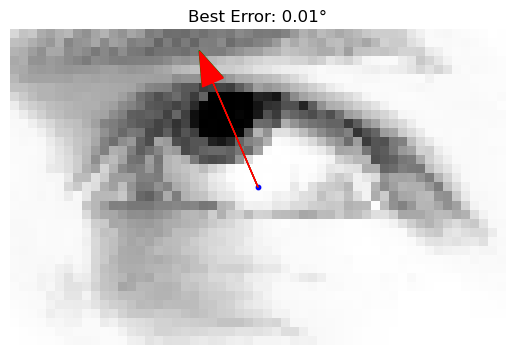

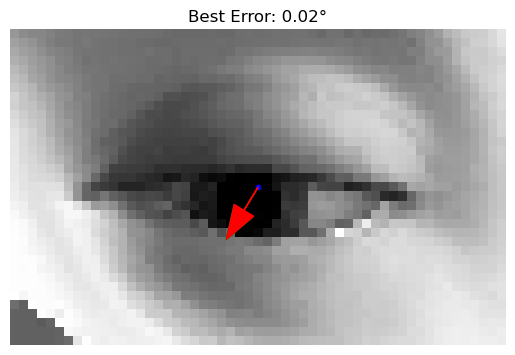

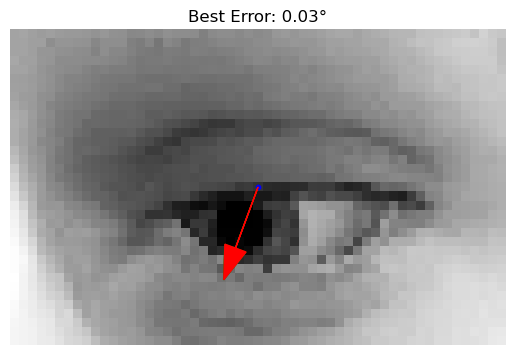

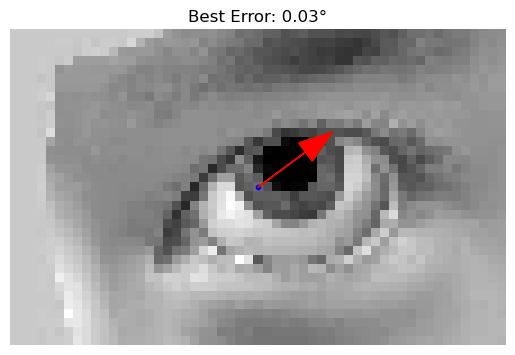

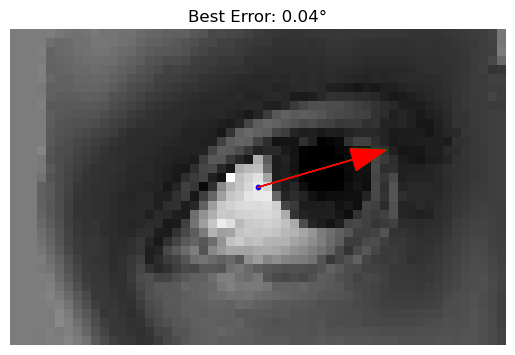


 Worst Predictions 


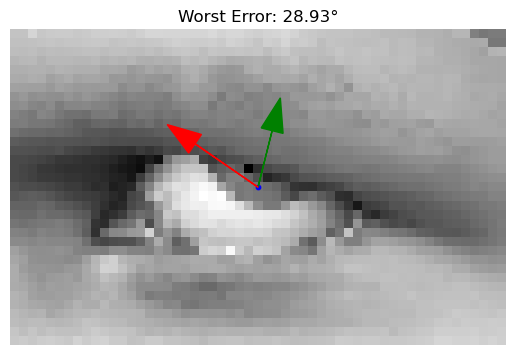

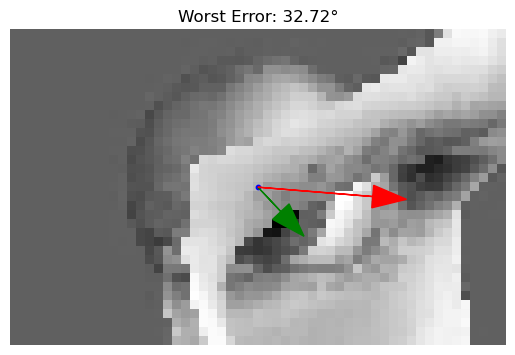

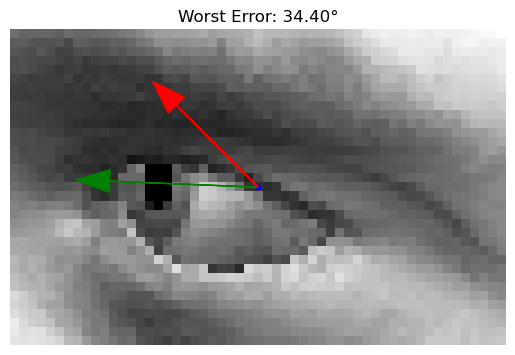

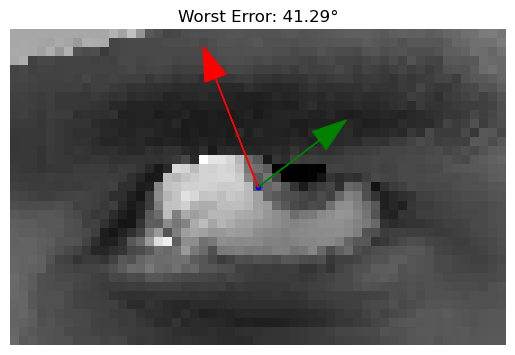

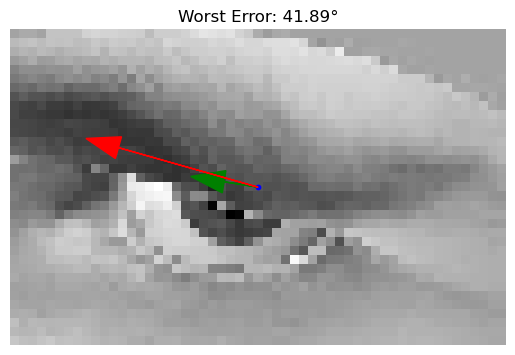

In [28]:
# Best cases
print("\n Best Predictions")
for idx in best_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_vit[idx], title=f"Best Error: {errors[idx]:.2f}°")
    plt.show()

# Worst cases 
print("\n Worst Predictions ")
for idx in worst_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_vit[idx], title=f"Worst Error: {errors[idx]:.2f}°")
    plt.show()

Setup for RNN

In [29]:
H, W = X_train_padded.shape[1], X_train_padded.shape[2]

X_train_rnn = X_train_padded.reshape(-1, W, H)
X_val_rnn = X_val_padded.reshape(-1, W, H)
X_test_rnn = X_test_padded.reshape(-1, W, H)

In [31]:
history_rnn = rnn_model.fit(
    X_train_rnn, y_train,
    validation_data=(X_val_rnn, y_val),
    epochs=50,
    batch_size=64
)

Epoch 1/50
516/516 [==============================] - 23s 28ms/step - loss: 0.0905 - mae: 0.2331 - val_loss: 0.0513 - val_mae: 0.1694
Epoch 2/50
516/516 [==============================] - 13s 24ms/step - loss: 0.0495 - mae: 0.1638 - val_loss: 0.0380 - val_mae: 0.1427
Epoch 3/50
516/516 [==============================] - 13s 25ms/step - loss: 0.0205 - mae: 0.1044 - val_loss: 0.0089 - val_mae: 0.0650
Epoch 4/50
516/516 [==============================] - 13s 24ms/step - loss: 0.0100 - mae: 0.0726 - val_loss: 0.0058 - val_mae: 0.0520
Epoch 5/50
516/516 [==============================] - 13s 25ms/step - loss: 0.0073 - mae: 0.0618 - val_loss: 0.0040 - val_mae: 0.0414
Epoch 6/50
516/516 [==============================] - 14s 27ms/step - loss: 0.0063 - mae: 0.0571 - val_loss: 0.0035 - val_mae: 0.0398
Epoch 7/50
516/516 [==============================] - 14s 28ms/step - loss: 0.0052 - mae: 0.0523 - val_loss: 0.0034 - val_mae: 0.0358
Epoch 8/50
516/516 [==============================] - 13s 25ms

In [32]:
y_pred_rnn = rnn_model.predict(X_test_rnn)

r2_rnn = r2_score(y_test, y_pred_rnn)

print(f"R^2: {r2_rnn:.4f}")

266/266 [==============================] - 4s 13ms/step
R^2: 0.9427


In [33]:
errors = []# gather all the errors here.
for i in range(len(y_test)):
    error = compute_angle_error(y_pred_rnn[i], y_test[i])
    errors.append(error)

errors = np.array(errors)

best_indices = np.argsort(errors)[:5]   # Top 5 best
worst_indices = np.argsort(errors)[-5:] # Top 5 worst

print("Best 5 errors:", errors[best_indices])
print("Worst 5 errors:", errors[worst_indices])

Best 5 errors: [0.01642824 0.02429986 0.02880105 0.03342123 0.04628141]
Worst 5 errors: [22.42333566 25.44807122 28.03501455 30.77065957 64.12749293]



 Best Predictions


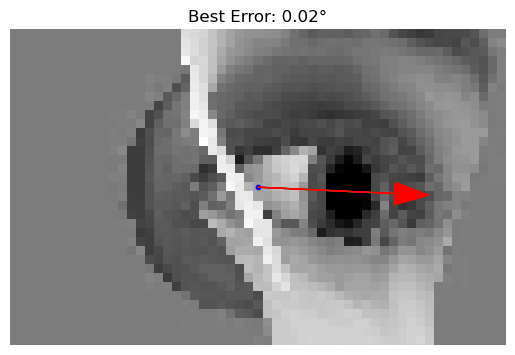

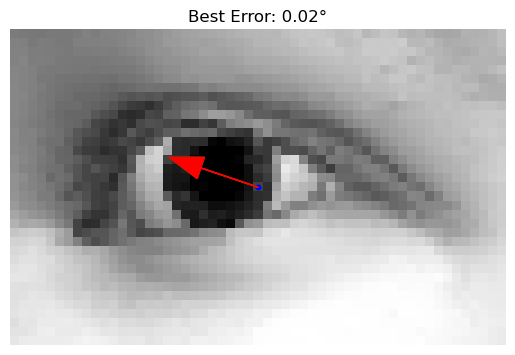

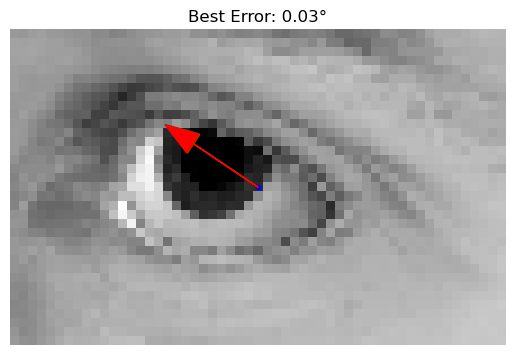

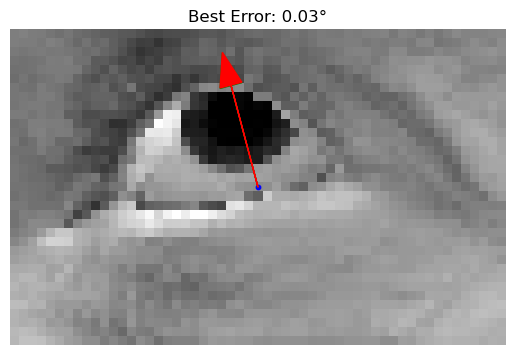

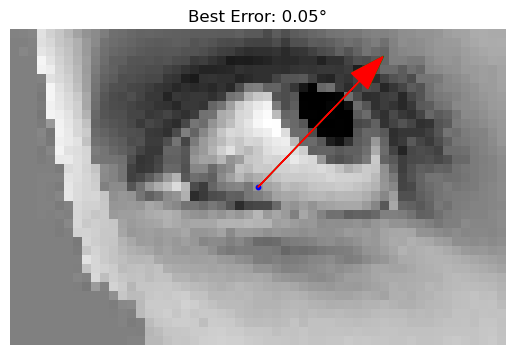


 Worst Predictions 


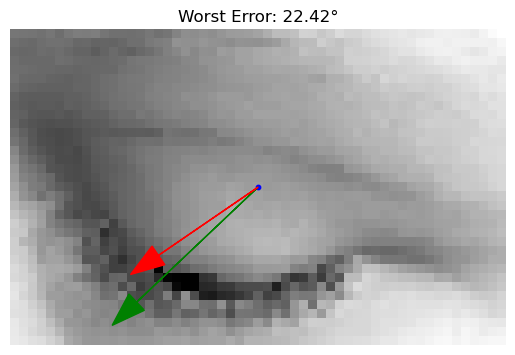

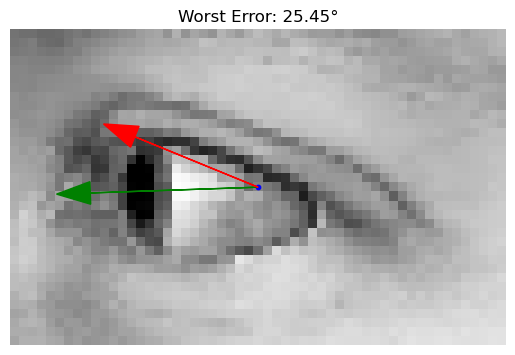

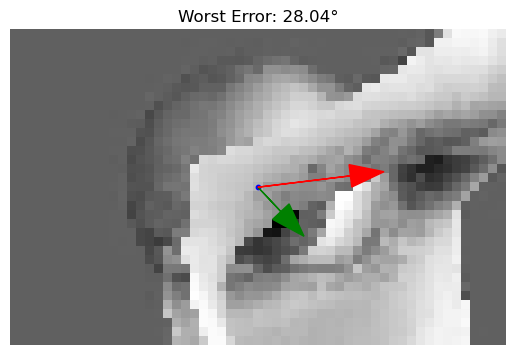

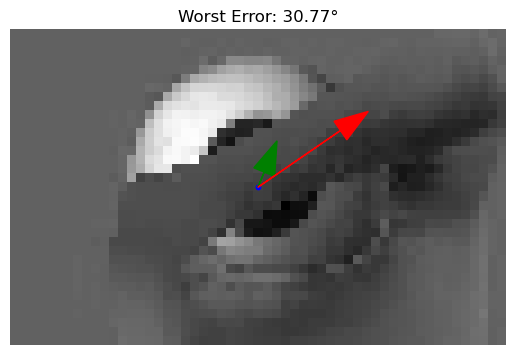

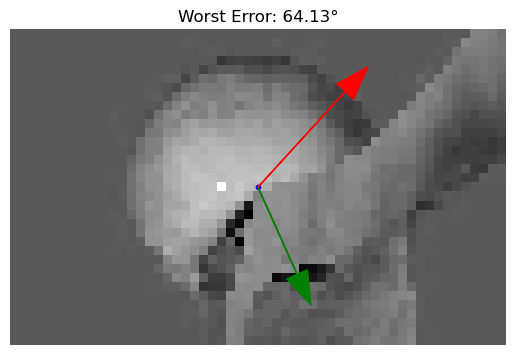

In [34]:
# Best cases
print("\n Best Predictions")
for idx in best_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_rnn[idx], title=f"Best Error: {errors[idx]:.2f}°")
    plt.show()

# Worst cases 
print("\n Worst Predictions ")
for idx in worst_indices:
    plot_gaze_vector(X_test[idx], y_test[idx], y_pred_rnn[idx], title=f"Worst Error: {errors[idx]:.2f}°")
    plt.show()

Everyone's performance compared.

In [35]:
#CNN
mse_cnn = mean_squared_error(y_test, y_pred)
#is just r2
#ViT
mse_vit = mean_squared_error(y_test, y_pred_vit)
#is just r2_vit

#RNN
mse_rnn = mean_squared_error(y_test, y_pred_rnn)
#print em
print(f"CNN MSE: {mse_cnn:.4f}, R^2: {r2:.4f}")
print(f"ViT MSE: {mse_vit:.4f}, R^2: {r2_vit:.4f}")
print(f"RNN MSE: {mse_rnn:.4f}, R^2: {r2_rnn:.4f}")

CNN MSE: 0.0001, R^2: 0.9980
ViT MSE: 0.0006, R^2: 0.9921
RNN MSE: 0.0040, R^2: 0.9427


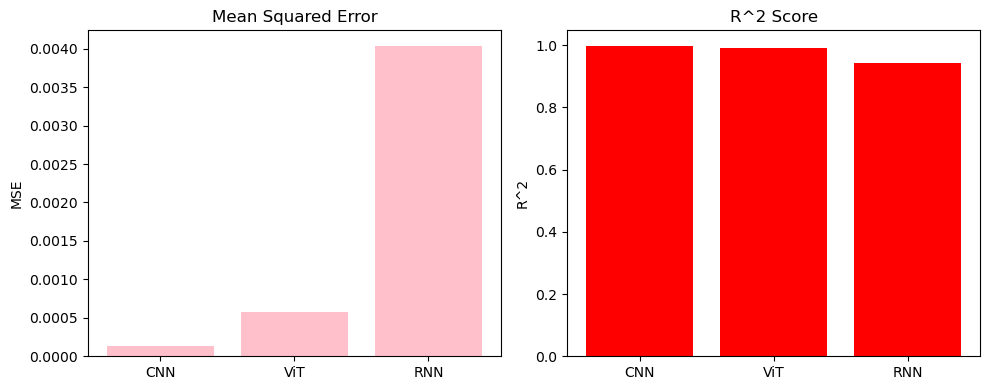

In [38]:
models = ['CNN', 'ViT','RNN']
mses = [mse_cnn, mse_vit,mse_rnn]
r2s = [r2, r2_vit,r2_rnn]

plt.figure(figsize=(10, 4))

# MSE
plt.subplot(1, 2, 1)
plt.bar(models, mses, color='pink')
plt.title("Mean Squared Error")
plt.ylabel("MSE")

# R^2
plt.subplot(1, 2, 2)
plt.bar(models, r2s, color='red')
plt.title("R^2 Score")
plt.ylabel("R^2")

plt.tight_layout()
plt.show()

# Jabed The asian special thanks.
Jabed created some code to test our dataset against RandomForest. Won't include here. He is lucky. Will include later.

# Future work:

Definetly use more models, to understand them as a learning process.

Perhaps combine multiple models. We read some research on that.

Hypertune our models by changing the parameters to see the performance. We did this only a little bit, we could definetly do it much more. Maybe read some articles/the reference documents to see the key differences on why our performance changes when we change this parameter, etc.

Find a real world application that ties in this to be more useful and practical. I.e using to eye gaze to predict autism. Or even in video games, person can just sitback and look around in a 3d environment. Eye tracking for ereaders, can scroll to the next page when the eyes hit the bottom of screen. Many applications for this small project. Many areas that can be expanded on.

Expand on the dataset or use another which has more features. Maybe we can find some correlations in skin color and common eye gaze directions. (Definetly not applicable) We can do much more with the dataset as well. We can solve problems involving predicting the eye pupil size or the iris size. We could also predict the head pose.

Use more real examples instead of synthetic ones.

Data wasn't perfect. Our data was pretty much using only synthetic. 
